# Term Deposit Sale

## Goal
Build a Model That will help the marketting team- to identify potential customers- who are relatively more likely to subsc=ribe to term deposit and thus increase hit ratio

### Dataset
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

In [6]:
#Import necessary modules & Libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt 
import seaborn as sns
import pandas_profiling
%matplotlib inline

#Supress warnings
import warnings
warnings.filterwarnings('ignore')
#For numerical libraries

#styling figures
plt.rc('font',size=14)
sns.set(style='white')
sns.set(style='whitegrid',color_codes=True)


#importing the Encoding library
from sklearn.preprocessing import LabelEncoder

#Import SMOTE library for handling imbalance class
from imblearn.over_sampling import SMOTE

#Import Decision Tree Classifier machine learning Library
from sklearn.tree import DecisionTreeClassifier

# Import Logistic Regression machine learning library
from sklearn.linear_model import LogisticRegression 

#Import Naive Bayes' machine learning Library
from sklearn.naive_bayes import GaussianNB

#Import Sklearn package's data splitting function which is based on random function
from sklearn.model_selection import train_test_split

#Import the metrics
from sklearn import metrics
#Import the Voting classifier for Ensemble
from sklearn.ensemble import VotingClassifier

In [7]:
bankdata_df = pd.read_csv('bank-full.csv')
bankdata_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


#- 16 independent variable, 1 dependent variable, lot of columns with string (non numeric)

In [8]:
bankdata_df.shape

(45211, 17)

In [9]:
bankdata_df.info()
# summary of data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [10]:
bankdata_df.isnull().sum()
# no missing values

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [11]:
bankdata_df.dtypes
# type of data, object columns need to be converted into categorical later in this exercise

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
Target       object
dtype: object

In [7]:
#cols = ['job', 'marital', 'education', 'default','housing', 'loan', 'contact', 'month', 'poutcome']
#bankdata_df[cols] = bankdata_df[cols].astype('category')

In [9]:
bankdata_df.shape

(45211, 17)

In [10]:
bankdata_df.describe().T
# we observe skeweness in data

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


####  Univariate Analysis

In [12]:
# Analysis for Job data
y=bankdata_df.job
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
#distribution of job data

               counts  percent
blue-collar      9732    21.53
management       9458    20.92
technician       7597    16.80
admin.           5171    11.44
services         4154     9.19
retired          2264     5.01
self-employed    1579     3.49
entrepreneur     1487     3.29
unemployed       1303     2.88
housemaid        1240     2.74
student           938     2.07
unknown           288     0.64


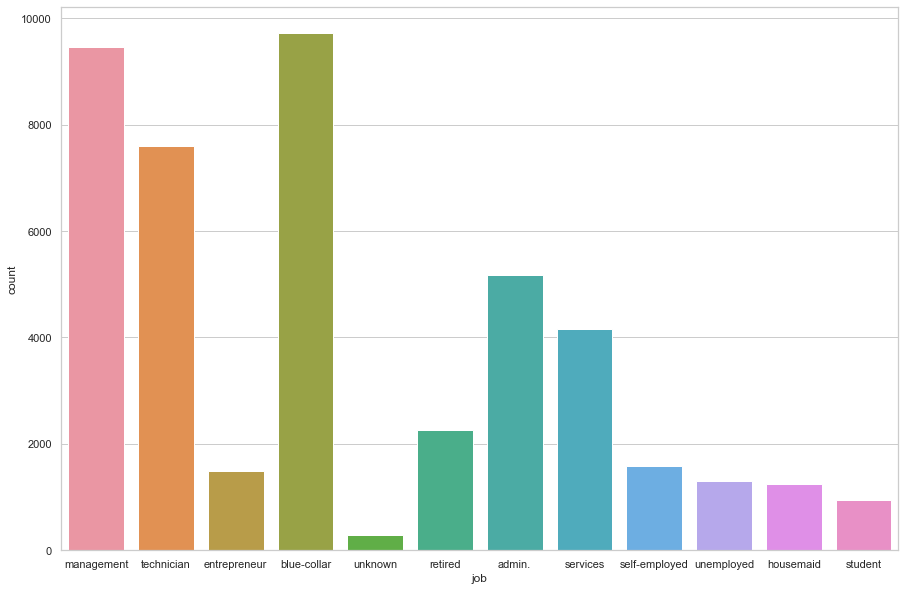

In [15]:
fig, ax=plt.subplots()
fig.set_size_inches(15,10)

#countplot
sns.countplot(bankdata_df['job'],data=bankdata_df)
ax1.set_xlabel('Job', fontsize=18)
ax1.set_ylabel('Count', fontsize=20)
ax1.set_title('Job vs Count', fontsize=20)
ax1.tick_params(labelsize=20)

          counts  percent
married    27214    60.19
single     12790    28.29
divorced    5207    11.52


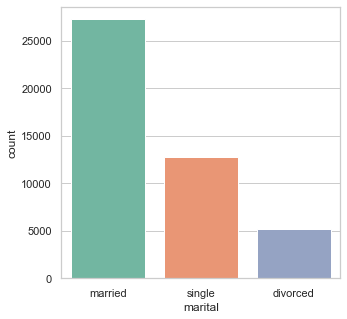

In [16]:
#Marital
y=bankdata_df.marital
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['marital'],palette='Set2')

           counts  percent
secondary   23202    51.32
tertiary    13301    29.42
primary      6851    15.15
unknown      1857     4.11


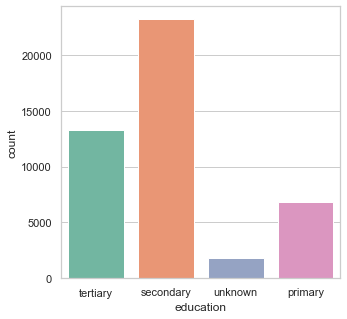

In [17]:
#Education analysis
y=bankdata_df.education
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['education'],palette='Set2')

     counts  percent
no    44396     98.2
yes     815      1.8


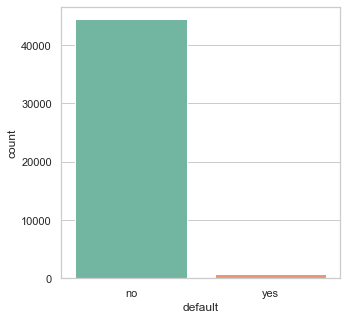

In [18]:
#education analysis
y=bankdata_df.default
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['default'],palette='Set2')

     counts  percent
yes   25130    55.58
no    20081    44.42


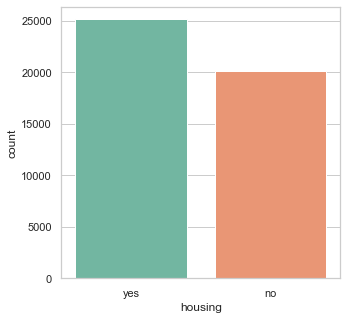

In [19]:
#Housing analysis
y=bankdata_df.housing
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['housing'],palette='Set2')

     counts  percent
no    37967    83.98
yes    7244    16.02


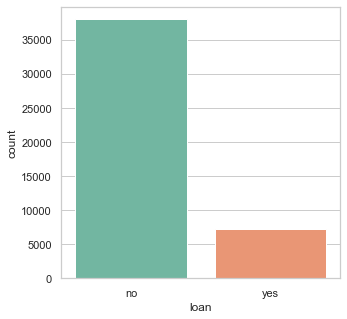

In [20]:
#Loan analysis
y=bankdata_df.loan
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['loan'],palette='Set2')

           counts  percent
cellular    29285    64.77
unknown     13020    28.80
telephone    2906     6.43


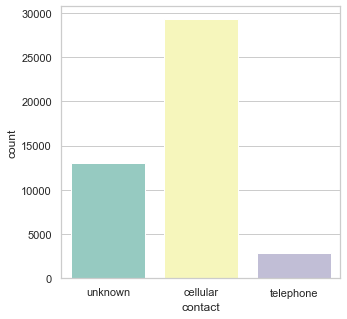

In [21]:
#Contact analysis
y=bankdata_df.contact
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['contact'],palette='Set3')

     counts  percent
may   13766    30.45
jul    6895    15.25
aug    6247    13.82
jun    5341    11.81
nov    3970     8.78
apr    2932     6.49
feb    2649     5.86
jan    1403     3.10
oct     738     1.63
sep     579     1.28
mar     477     1.06
dec     214     0.47


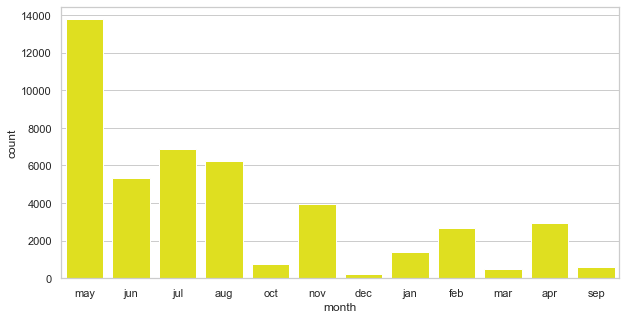

In [22]:
#Month analysis
y=bankdata_df.month
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(10,5))
sns.countplot(bankdata_df['month'],color='yellow')

         counts  percent
unknown   36959    81.75
failure    4901    10.84
other      1840     4.07
success    1511     3.34


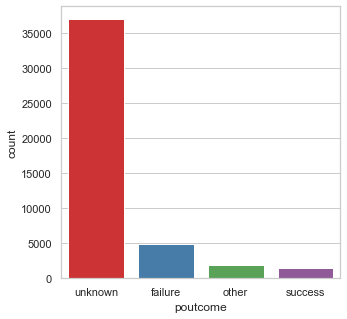

In [23]:
#Poutcome analysis
y=bankdata_df.poutcome
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['poutcome'],palette='Set1')

     counts  percent
no    39922     88.3
yes    5289     11.7


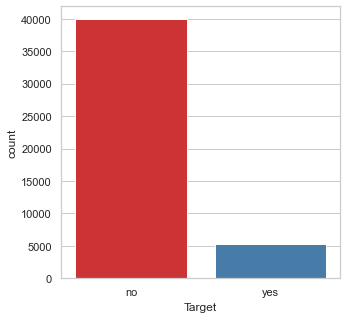

In [24]:
#Target analysis
y=bankdata_df.Target
counts=y.value_counts()
percent=y.value_counts(normalize=True).mul(100).round(2)
print(pd.DataFrame({'counts':counts,'percent':percent}))
plt.figure(figsize=(5,5))
sns.countplot(bankdata_df['Target'],palette='Set1')
# majority of data falls as No to subscription


AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  0.6848179257252598


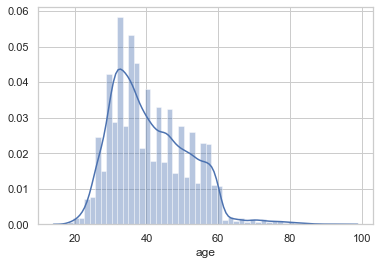

In [25]:
# Age distribution & Skewness
print(sns.distplot(bankdata_df.age))
print("Skweness is: ",bankdata_df['age'].skew())

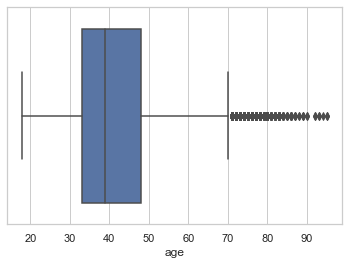

In [26]:
sns.boxplot(x='age',data=bankdata_df)
# outliers

AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  8.360308326166326


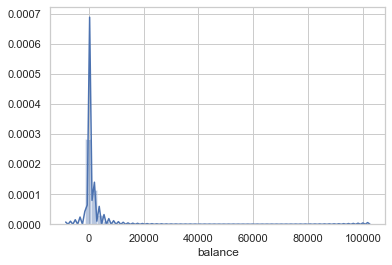

In [27]:
# Balance distribution & Skewness
print(sns.distplot(bankdata_df.balance))
print("Skweness is: ",bankdata_df['balance'].skew())

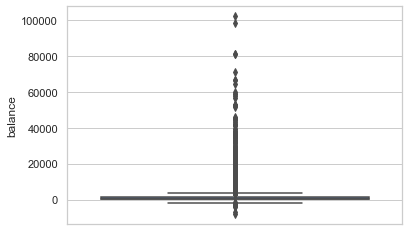

In [28]:
sns.boxplot(y='balance',data=bankdata_df)
# Outliers

AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  0.09307901402122411


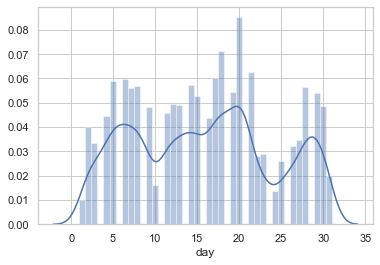

In [29]:
# Day distribution & Skewness
print(sns.distplot(bankdata_df.day))
print("Skweness is: ",bankdata_df['day'].skew())
#Multimodel distribution

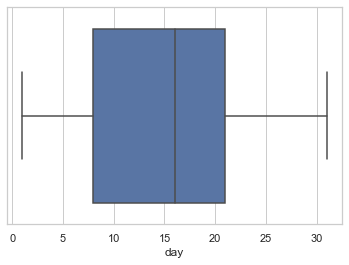

In [30]:
sns.boxplot(x='day',data=bankdata_df)

AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  3.144318099423456


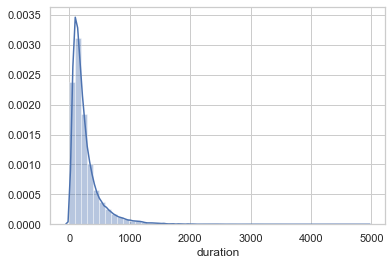

In [31]:
# Duration distribution & Skewness
print(sns.distplot(bankdata_df.duration))
print("Skweness is: ",bankdata_df['duration'].skew())

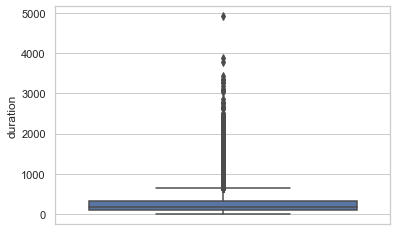

In [32]:
sns.boxplot(y='duration',data=bankdata_df)
#outliers (hug data falls in it)

AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  4.898650166179674


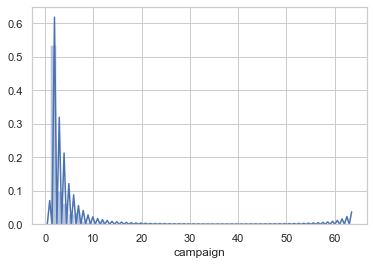

In [33]:
# Campaign distribution & Skewness
print(sns.distplot(bankdata_df.campaign))
print("Skweness is: ",bankdata_df['campaign'].skew())

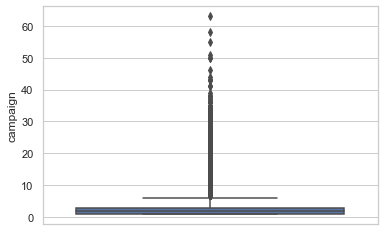

In [34]:
sns.boxplot(y='campaign',data=bankdata_df)

AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  2.6157154736563477


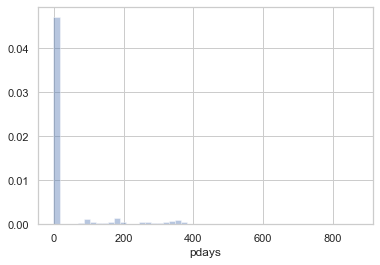

In [35]:
# Pdays distribution & Skewness
print(sns.distplot(bankdata_df.pdays))
print("Skweness is: ",bankdata_df['pdays'].skew())

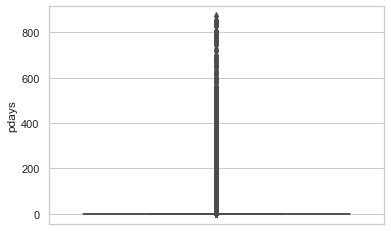

In [36]:
sns.boxplot(y='pdays',data=bankdata_df)

AxesSubplot(0.125,0.125;0.775x0.755)
Skweness is:  41.84645447266292


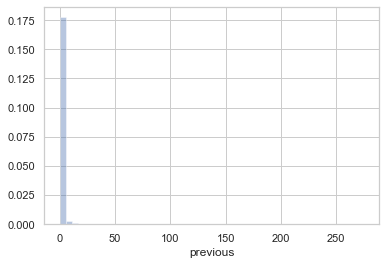

In [37]:
# Previous distribution & Skewness
print(sns.distplot(bankdata_df.previous))
print("Skweness is: ",bankdata_df['previous'].skew())

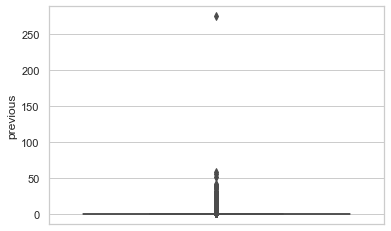

In [38]:
sns.boxplot(y='previous',data=bankdata_df)

In [39]:
bankdata_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [39]:
bankdata_df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


### Multivariate Analysis


In [40]:
bankdata_df.groupby(['Target']).agg(['mean','median'])

age             balance               day           duration  \
             mean median         mean median       mean median        mean   
Target                                                                       
no      40.838986     39  1303.714969    417  15.892290     16  221.182806   
yes     41.670070     38  1804.267915    733  15.158253     15  537.294574   

               campaign             pdays         previous         
       median      mean median       mean median      mean median  
Target                                                             
no        164  2.846350      2  36.421372     -1  0.502154      0  
yes       426  2.141047      2  68.702968     -1  1.170354      0

Target                no        yes
job                                
student        71.321962  28.678038
retired        77.208481  22.791519
unemployed     84.497314  15.502686
management     86.244449  13.755551
admin.         87.797331  12.202669
self-employed  88.157061  11.842939
unknown        88.194444  11.805556
technician     88.943004  11.056996
services       91.116996   8.883004
housemaid      91.209677   8.790323
entrepreneur   91.728312   8.271688
blue-collar    92.725031   7.274969


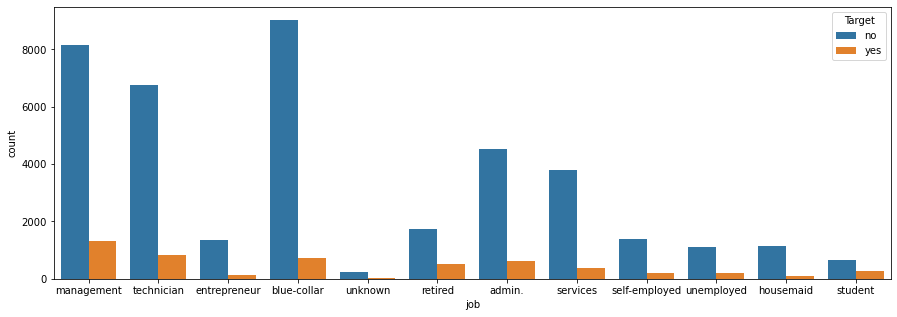

In [41]:
print(pd.crosstab(bankdata_df['job'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(15,5))
sns.countplot(x='job',hue='Target',data=bankdata_df)
# No to subscription is dominant data

Target           no        yes
marital                       
single    85.050821  14.949179
divorced  88.054542  11.945458
married   89.876534  10.123466


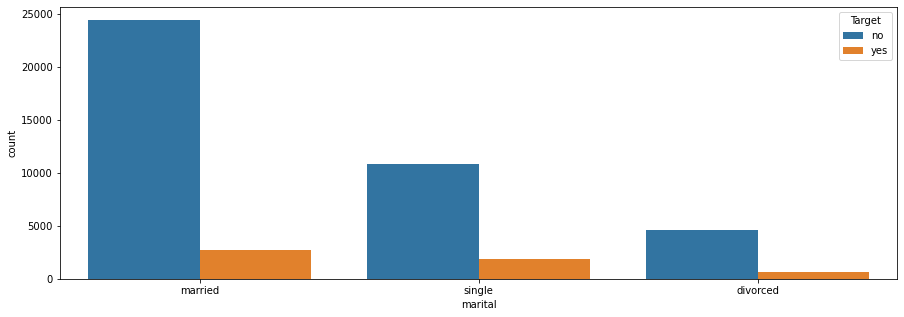

In [42]:
print(pd.crosstab(bankdata_df['marital'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(15,5))
sns.countplot(x='marital',hue='Target',data=bankdata_df)

Target            no        yes
education                      
tertiary   84.993610  15.006390
unknown    86.429725  13.570275
secondary  89.440565  10.559435
primary    91.373522   8.626478


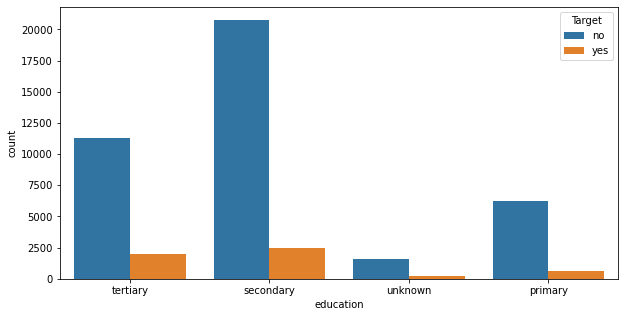

In [43]:
print(pd.crosstab(bankdata_df['education'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='education',hue='Target',data=bankdata_df)

Target          no        yes
default                      
no       88.203892  11.796108
yes      93.619632   6.380368


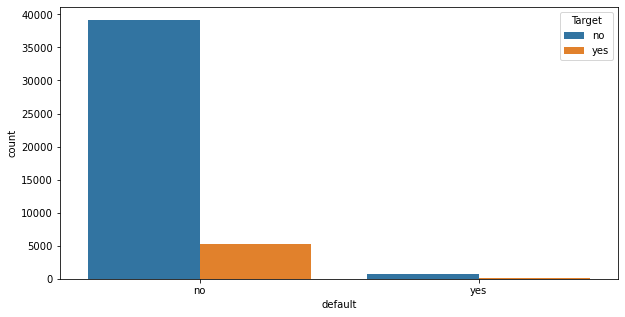

In [44]:
print(pd.crosstab(bankdata_df['default'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='default',hue='Target',data=bankdata_df)

Target          no        yes
housing                      
no       83.297645  16.702355
yes      92.300040   7.699960


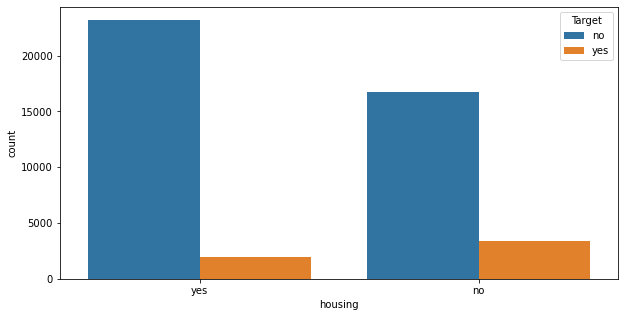

In [45]:
print(pd.crosstab(bankdata_df['housing'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='housing',hue='Target',data=bankdata_df)

Target         no        yes
loan                        
no      87.344273  12.655727
yes     93.318609   6.681391


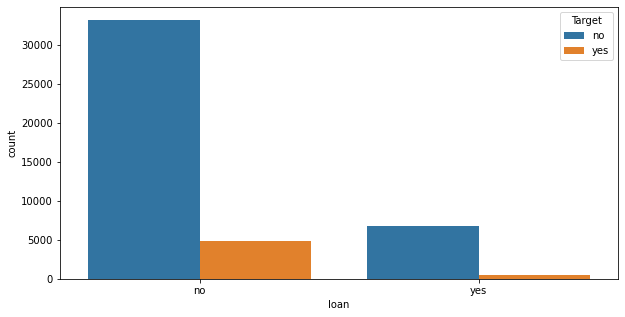

In [46]:
print(pd.crosstab(bankdata_df['loan'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='loan',hue='Target',data=bankdata_df)

Target            no        yes
contact                        
cellular   85.081100  14.918900
telephone  86.579491  13.420509
unknown    95.929339   4.070661


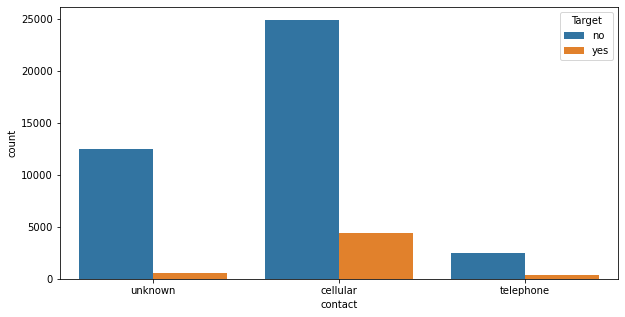

In [47]:
print(pd.crosstab(bankdata_df['contact'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='contact',hue='Target',data=bankdata_df)

Target         no        yes
month                       
mar     48.008386  51.991614
dec     53.271028  46.728972
sep     53.540587  46.459413
oct     56.233062  43.766938
apr     80.320600  19.679400
feb     83.352208  16.647792
aug     88.986714  11.013286
jun     89.777195  10.222805
nov     89.848866  10.151134
jan     89.878831  10.121169
jul     90.906454   9.093546
may     93.280546   6.719454


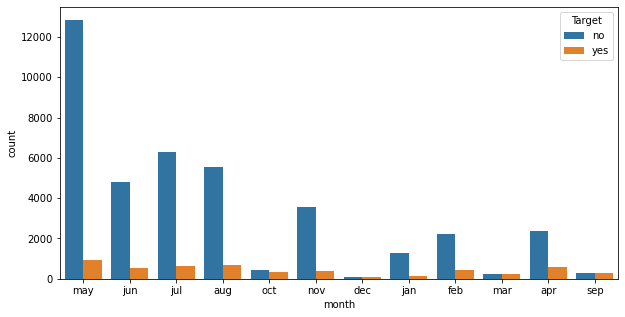

In [48]:
print(pd.crosstab(bankdata_df['month'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='month',hue='Target',data=bankdata_df)

Target           no        yes
poutcome                      
success   35.274653  64.725347
other     83.315217  16.684783
failure   87.390329  12.609671
unknown   90.838497   9.161503


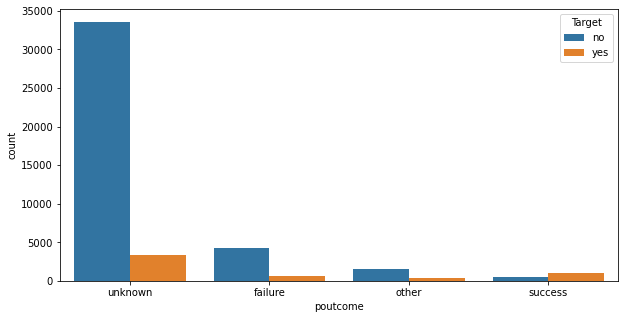

In [49]:
print(pd.crosstab(bankdata_df['poutcome'],bankdata_df['Target'],normalize='index').mul(100).sort_values(by='yes',ascending=False))
plt.figure(figsize=(10,5))
sns.countplot(x='poutcome',hue='Target',data=bankdata_df)

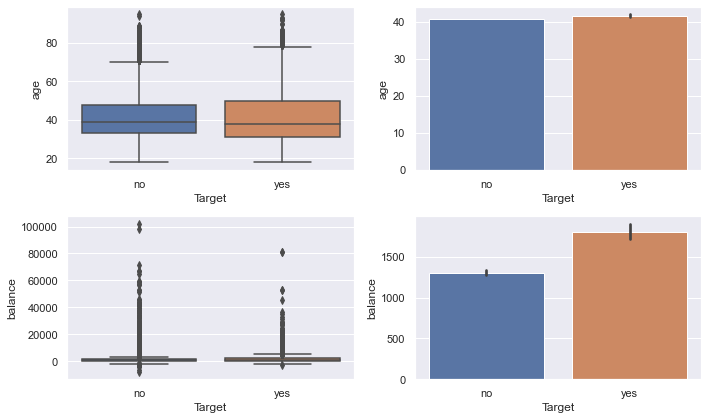

In [53]:
fig, ax=plt.subplots(2,2,figsize=(10,6))
#Target vs Age, balance, (categorical vs Continuous)
#boxplot
sns.boxplot(x="Target", y="age", data=bankdata_df,ax=ax[0][0])
#barplot
sns.barplot(x="Target", y="age", data=bankdata_df,ax=ax[0][1])
# Categorical vs Continuous ----Target vs balance
#boxplot
sns.boxplot(x="Target", y="balance", data=bankdata_df,ax=ax[1][0])
#barplot
sns.barplot(x="Target", y="balance", data=bankdata_df,ax=ax[1][1])
plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

In [40]:
bankdata_df['Target']=bankdata_df.Target.astype('category')
bankdata_df['job']=bankdata_df.job.astype('category')
bankdata_df['marital']=bankdata_df.marital.astype('category')
bankdata_df['education']=bankdata_df.education.astype('category')
bankdata_df['default']=bankdata_df.default.astype('category')
bankdata_df['housing']=bankdata_df.housing.astype('category')
bankdata_df['loan']=bankdata_df.loan.astype('category')
bankdata_df['contact']=bankdata_df.contact.astype('category')
bankdata_df['month']=bankdata_df.month.astype('category')
bankdata_df['poutcome']=bankdata_df.poutcome.astype('category')

bankdata_df.dtypes

age             int64
job          category
marital      category
education    category
default      category
balance         int64
housing      category
loan         category
contact      category
day             int64
month        category
duration        int64
campaign        int64
pdays           int64
previous        int64
poutcome     category
Target       category
dtype: object

In [42]:
#Optimize the number of classes in job
bankdata_df['job']=np.where(bankdata_df['job']=='blue-collar','worker',bankdata_df['job'])
bankdata_df['job']=np.where(bankdata_df['job']=='housemaid','worker',bankdata_df['job'])
bankdata_df['job']=np.where(bankdata_df['job']=='management','managerial',bankdata_df['job'])
bankdata_df['job']=np.where(bankdata_df['job']=='services','managerial',bankdata_df['job'])
bankdata_df['job']=np.where(bankdata_df['job']=='admin','managerial',bankdata_df['job'])
bankdata_df['job']=np.where(bankdata_df['job']=='enterpreneur','managerial',bankdata_df['job'])

bankdata_df['job'].unique()

array(['managerial', 'technician', 'entrepreneur', 'worker', 'unknown',
       'retired', 'admin.', 'self-employed', 'unemployed', 'student'],
      dtype=object)

In [43]:
#Encoding of categorical variables

labelencoder_X=LabelEncoder()
bankdata_df['job']=labelencoder_X.fit_transform(bankdata_df['job'])
bankdata_df['marital']=labelencoder_X.fit_transform(bankdata_df['marital'])
bankdata_df['education']=labelencoder_X.fit_transform(bankdata_df['education'])
bankdata_df['default']=labelencoder_X.fit_transform(bankdata_df['default'])
bankdata_df['housing']=labelencoder_X.fit_transform(bankdata_df['housing'])
bankdata_df['loan']=labelencoder_X.fit_transform(bankdata_df['loan'])
bankdata_df['contact']= labelencoder_X.fit_transform(bankdata_df['contact']) 
bankdata_df['month']= labelencoder_X.fit_transform(bankdata_df['month']) 
bankdata_df['poutcome'] = labelencoder_X.fit_transform(bankdata_df['poutcome'])
bankdata_df['Target'] = labelencoder_X.fit_transform(bankdata_df['Target'])

In [44]:
bankdata_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,2,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,6,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,1,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,9,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,8,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0


In [45]:
bankdata_df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211.0,4.473779,3.205847,0.0,2.0,4.0,7.0,9.0
marital,45211.0,1.167725,0.608230,0.0,1.0,1.0,2.0,2.0
education,45211.0,1.224813,0.747997,0.0,1.0,1.0,2.0,3.0
default,45211.0,0.018027,0.133049,0.0,0.0,0.0,0.0,1.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211.0,0.555838,0.496878,0.0,0.0,1.0,1.0,1.0
loan,45211.0,0.160226,0.366820,0.0,0.0,0.0,0.0,1.0
contact,45211.0,0.640242,0.897951,0.0,0.0,0.0,2.0,2.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0


In [46]:
# Corrlation Matrix
cor=bankdata_df.corr()
cor

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
age,1.000000,-0.019980,-0.403240,-0.106807,-0.017879,0.097783,-0.185513,-0.015655,0.026221,-0.009120,-0.042357,-0.004648,0.004760,-0.023758,0.001288,0.007367,0.025155
job,-0.019980,1.000000,-0.012009,-0.320070,0.006475,-0.036583,0.066957,-0.015011,0.094748,-0.007327,0.015160,0.010794,0.015967,-0.007486,-0.023964,0.023881,-0.053212
marital,-0.403240,-0.012009,1.000000,0.108576,-0.007023,0.002122,-0.016096,-0.046893,-0.039201,-0.005261,-0.006991,0.011852,-0.008994,0.019172,0.014973,-0.016850,0.045588
education,-0.106807,-0.320070,0.108576,1.000000,-0.010718,0.064514,-0.090790,-0.048574,-0.110928,0.022671,-0.057304,0.001935,0.006255,0.000052,0.017570,-0.019361,0.066241
default,-0.017879,0.006475,-0.007023,-0.010718,1.000000,-0.066745,-0.006025,0.077234,0.015404,0.009424,0.011486,-0.010021,0.016822,-0.029979,-0.018329,0.034898,-0.022419
balance,0.097783,-0.036583,0.002122,0.064514,-0.066745,1.000000,-0.068768,-0.084350,-0.027273,0.004503,0.019777,0.021560,-0.014578,0.003435,0.016674,-0.020967,0.052838
housing,-0.185513,0.066957,-0.016096,-0.090790,-0.006025,-0.068768,1.000000,0.041323,0.188123,-0.027982,0.271481,0.005075,-0.023599,0.124178,0.037076,-0.099971,-0.139173
loan,-0.015655,-0.015011,-0.046893,-0.048574,0.077234,-0.084350,0.041323,1.000000,-0.010873,0.011370,0.022145,-0.012412,0.009980,-0.022754,-0.011043,0.015458,-0.068185
contact,0.026221,0.094748,-0.039201,-0.110928,0.015404,-0.027273,0.188123,-0.010873,1.000000,-0.027936,0.361145,-0.020839,0.019614,-0.244816,-0.147811,0.272214,-0.148395
day,-0.009120,-0.007327,-0.005261,0.022671,0.009424,0.004503,-0.027982,0.011370,-0.027936,1.000000,-0.006028,-0.030206,0.162490,-0.093044,-0.051710,0.083460,-0.028348


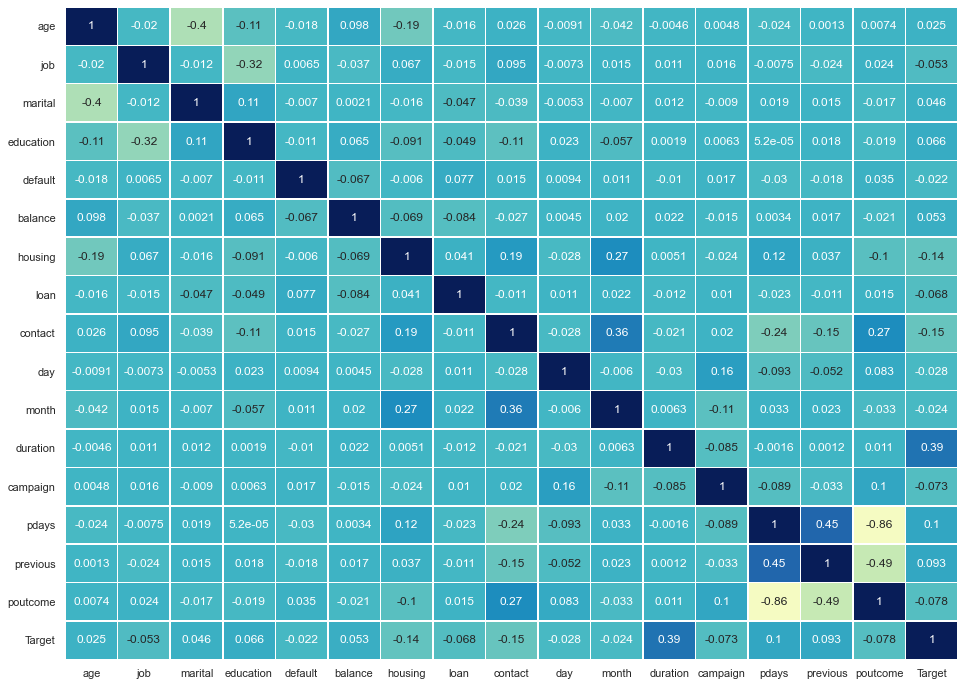

In [47]:
#Heatmap Plot (correlation)
sns.set(rc={'figure.figsize':(16,12)})
sns.heatmap(bankdata_df.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")
plt.show()

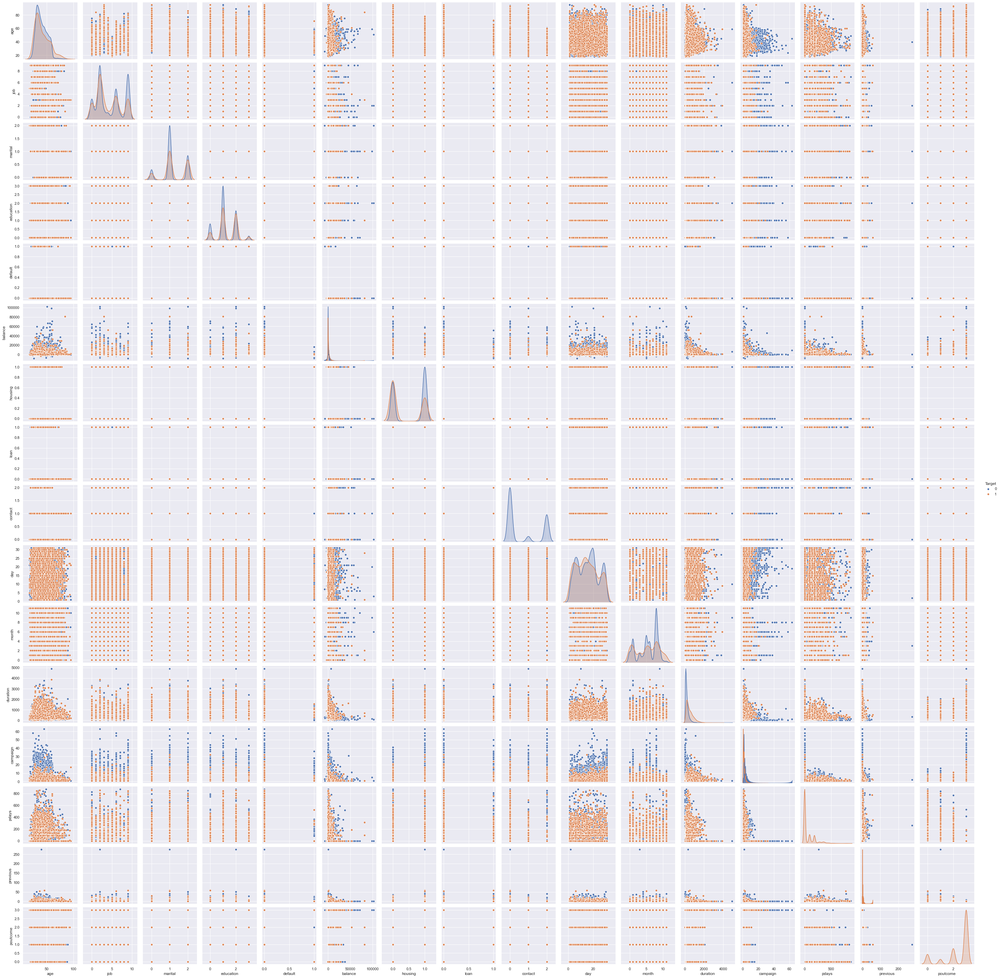

In [48]:
sns.pairplot(bankdata_df,hue='Target')

In [ ]:
# Model:
# Spliting Data

In [50]:
#independent and dependent variables
X=bankdata_df.loc[:,bankdata_df.columns!='Target']
y=bankdata_df.loc[:,bankdata_df.columns=='Target']

In [51]:
# Split X and y into training and test set in 70:30 ratio
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)
columns=X_train.columns

In [52]:
# invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option                             
dt_model = DecisionTreeClassifier(criterion = 'entropy',random_state=100 )
#Fitting the model
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=100)

In [58]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
bankdata_df=bankdata_df
xvar = bankdata_df.drop('Target', axis=1)
feature_cols = xvar.columns

In [60]:
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bankdata_df.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.318234 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.318234 to fit



In [ ]:
# Complex tree- probably need to try with Pruning

In [61]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))
# higher the number- will impact Target more., Month, duration & Balance

                Imp
age        0.090699
job        0.036185
marital    0.019029
education  0.022046
default    0.000869
balance    0.102435
housing    0.027805
loan       0.007143
contact    0.056033
day        0.086493
month      0.103351
duration   0.310855
campaign   0.032524
pdays      0.057438
previous   0.016822
poutcome   0.030273


In [62]:
# prediction
y_predict = dt_model.predict(X_test)

In [63]:
# performance on train data
print('Performance on Training data using DT: ',dt_model.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using DT: ',dt_model.score(X_test , y_test))

Performance on Training data using DT:  1.0
Performance on Testing data using DT:  0.8754792096726629


In [ ]:
# Training 100% - overfitting, while on testing accuracy dropped.

In [64]:
# accuracy, confusion metrix, and classification report
acc_DT=metrics.accuracy_score(y_test, y_predict)
print('Accuracy DT: ',acc_DT)
print('Confusion Matrix DT: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report DT: \n',metrics.classification_report(y_test, y_predict))
#with decision tree - 87% accuracy which leads to 13% error

Accuracy DT:  0.8754792096726629
Confusion Matrix DT: 
 [[11101   868]
 [  821   774]]
Classification report DT: 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93     11969
           1       0.47      0.49      0.48      1595

    accuracy                           0.88     13564
   macro avg       0.70      0.71      0.70     13564
weighted avg       0.88      0.88      0.88     13564



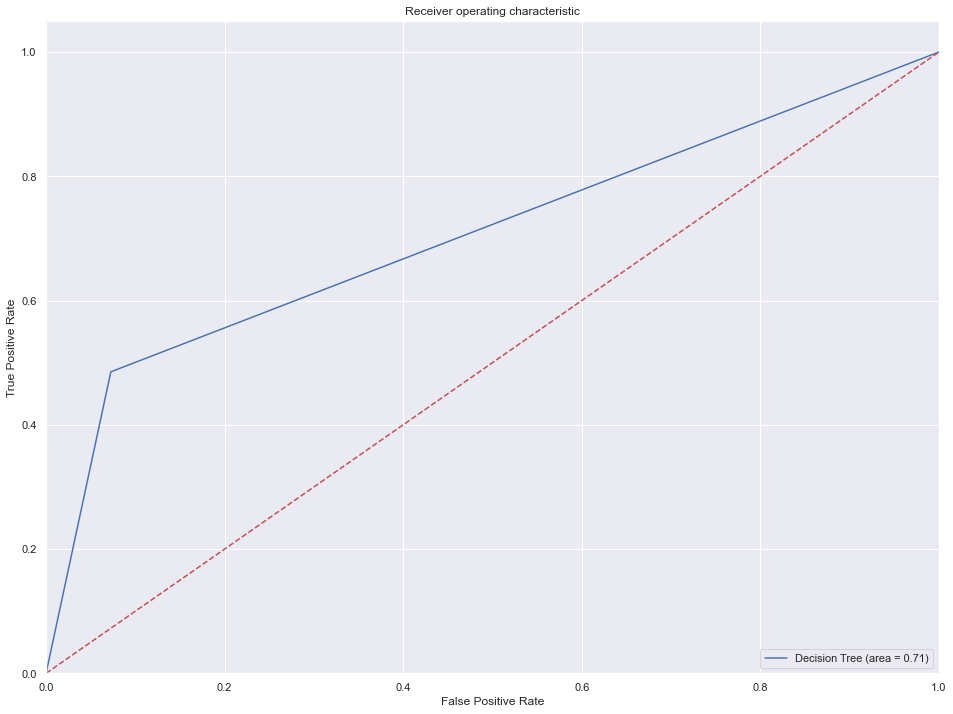

In [69]:
#ROC Curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
dt_roc_auc = roc_auc_score(y_test, dt_model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, dt_model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Decision Tree (area = %0.2f)' % dt_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [65]:
#Store the accuracy results for each model in a dataframe for final comparison
results = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT},index={'1'})
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.875479


#### Pruning- Decision Tree

In [80]:
# Regularizing - Decision tree classifier & fitting the model
reg_dt_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = 9,random_state=100,min_samples_leaf=5)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=5,
                       random_state=100)

In [81]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))
# same as pre pruning: month, duration and balance impact Target more

                Imp
age        0.090699
job        0.036185
marital    0.019029
education  0.022046
default    0.000869
balance    0.102435
housing    0.027805
loan       0.007143
contact    0.056033
day        0.086493
month      0.103351
duration   0.310855
campaign   0.032524
pdays      0.057438
previous   0.016822
poutcome   0.030273


### Visualization- 

In [82]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
bankdata_df=bankdata_df
xvar = bankdata_df.drop('Target', axis=1)
feature_cols = xvar.columns

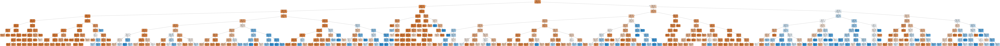

In [83]:
dot_data = StringIO()
export_graphviz(reg_dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bankdata_df_pruned.png')
Image(graph.create_png())

In [84]:
y_predict = reg_dt_model.predict(X_test)

In [85]:
# performance on train data
print('Performance on Training data using  Pruned DT: ',reg_dt_model.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using  Pruned DT: ',reg_dt_model.score(X_test , y_test))
#In Training & testing data results are very close- Pruned DT model is doing well

Performance on Training data using  Pruned DT:  0.9181912977533415
Performance on Testing data using  Pruned DT:  0.8964907107048068


In [86]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_pruned_DT=metrics.accuracy_score(y_test, y_predict)
print("Accuracy Pruned DT:",acc_pruned_DT)
print('Confusion Matrix Pruned DT: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report Pruned DT: \n',metrics.classification_report(y_test, y_predict))

Accuracy Pruned DT: 0.8964907107048068
Confusion Matrix Pruned DT: 
 [[11427   542]
 [  862   733]]
Classification report Pruned DT: 
               precision    recall  f1-score   support

           0       0.93      0.95      0.94     11969
           1       0.57      0.46      0.51      1595

    accuracy                           0.90     13564
   macro avg       0.75      0.71      0.73     13564
weighted avg       0.89      0.90      0.89     13564



In [ ]:
 #Regularized Decision Tree - accuracy is 90% higher than previous model.

In [87]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree'], 'accuracy': [acc_pruned_DT]},index={'2'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results
# Increasing Depth to 5,& to 9 increase in Pruned decision accuracy

,Method,accuracy
1,Decision Tree,0.875479
2,Pruned Decision Tree,0.888381
2,Pruned Decision Tree,0.896491


In [ ]:
# Randon Forest Classfier

In [89]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50,random_state=100)
rfcl = rfcl.fit(X_train, y_train)

In [90]:
y_predict = rfcl.predict(X_test)
acc_RF=metrics.accuracy_score(y_test , y_predict)
print('Accuracy using Random forest: ',acc_RF)
print('Confusion Matrix Random Forest: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using Random forest:  0.9026835741669124
Confusion Matrix Random Forest: 
 [[11570   399]
 [  921   674]]


In [91]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]},index={'3'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.875479
2,Pruned Decision Tree,0.888381
2,Pruned Decision Tree,0.896491
3,Random Forest,0.902684


In [ ]:
# Bagging

In [92]:
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=100,random_state=100)
bgcl = bgcl.fit(X_train, y_train)

In [93]:
y_predict = bgcl.predict(X_test)
acc_bg=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using Bagging: ',acc_bg)
print('Confusion Matrix using Bagging: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using Bagging:  0.8991447950457092
Confusion Matrix using Bagging: 
 [[11462   507]
 [  861   734]]


In [94]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_bg]},index={'4'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.875479
2,Pruned Decision Tree,0.888381
2,Pruned Decision Tree,0.896491
3,Random Forest,0.902684
4,Bagging,0.899145


#### AdaBoosting

In [96]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(base_estimator=dt_model, n_estimators=100,random_state=100)
abcl = abcl.fit(X_train, y_train)

In [97]:
y_predict = abcl.predict(X_test)
acc_AB=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using AdaBoosting: ',acc_AB)
print('Confusion Matrix: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using AdaBoosting:  0.8751843114125627
Confusion Matrix: 
 [[11084   885]
 [  808   787]]


In [98]:
tempResultsDf = pd.DataFrame({'Method':['AdaBoosting'], 'accuracy': [acc_AB]},index={'5'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.875479
2,Pruned Decision Tree,0.888381
2,Pruned Decision Tree,0.896491
3,Random Forest,0.902684
4,Bagging,0.899145
5,AdaBoosting,0.875184


In [ ]:
# For AdaBoosting- accuracy slightly dropped

#### Gradient Boosting

In [99]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=100)
gbcl = gbcl.fit(X_train, y_train)

In [100]:
y_predict = gbcl.predict(X_test)
acc_GB=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using GradientBoosting: ',acc_GB)
print('Confusion Matrix using GradientBoosting: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using GradientBoosting:  0.8995871424358596
Confusion Matrix using GradientBoosting: 
 [[11648   321]
 [ 1041   554]]


In [101]:
tempResultsDf = pd.DataFrame({'Method':['GradientBoosting'], 'accuracy': [acc_GB]},index={'6'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.875479
2,Pruned Decision Tree,0.888381
2,Pruned Decision Tree,0.896491
3,Random Forest,0.902684
4,Bagging,0.899145
5,AdaBoosting,0.875184
6,GradientBoosting,0.899587


In [ ]:
#Gradient Boosting accuracy better than Ada Bossting & close to Pruned model.

In [ ]:
# Enseble Logistic Regression, Decisiion Tree

In [102]:
#Multiple model Ensemble
from sklearn import svm
LR=LogisticRegression()
NB=GaussianNB()
#DT=DecisionTreeClassifier()  ('DT',DT),
SVM=svm.SVC()

In [103]:
evc=VotingClassifier(estimators=[('LR',LR),('NB',NB),('SVM',SVM)],voting='hard')

In [104]:
evc.fit(X_train,y_train)

VotingClassifier(estimators=[('LR', LogisticRegression()), ('NB', GaussianNB()),
                             ('SVM', SVC())])

In [105]:
y_predict = evc.predict(X_test)
#evc.score(X_test,y_test)

In [106]:
acc_Ensemble=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using Ensemble: ',acc_Ensemble)
print('Confusion Matrix: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using Ensemble:  0.8858743733411973
Confusion Matrix: 
 [[11747   222]
 [ 1326   269]]


In [107]:
tempResultsDf = pd.DataFrame({'Method':['Ensemble'], 'accuracy': [acc_Ensemble]},index={'7'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results
# Not much improvement

,Method,accuracy
1,Decision Tree,0.875479
2,Pruned Decision Tree,0.888381
2,Pruned Decision Tree,0.896491
3,Random Forest,0.902684
4,Bagging,0.899145
5,AdaBoosting,0.875184
6,GradientBoosting,0.899587
7,Ensemble,0.885874


In [ ]:
# Random Forest, Bagging, Gradient Boosting & Prune decision gives highest accuracy- though others are not far off. We have to see with managing imbalance and normalizing colums results
as this data is biased to customers who in majority and too much skewed to customers who dont have subscription to terms

#### Model- Normalizing columns- Scaling

In [108]:
#independent and dependent variables
bankdata_scale=bankdata_df
X=bankdata_scale.loc[:,bankdata_scale.columns!='Target']
y=bankdata_scale.loc[:,bankdata_scale.columns=='Target']

In [109]:
# Split X and y into training and test set in 70:30 ratio
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)
columns=X_train.columns

In [110]:
#for normalization
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [112]:
bankdata_scale.groupby('Target').size()

Target
0    39922
1     5289
dtype: int64

In [113]:
#Import the library for handling the imbalance dataset
from imblearn.over_sampling import SMOTE
Ov_sampling=SMOTE(random_state=100)
# now use SMOTE to oversample our train data which have features data_train_X and labels in data_train_y
ov_data_X,ov_data_y=Ov_sampling.fit_sample(X_train,y_train)
ov_data_X=pd.DataFrame(data=ov_data_X,columns=columns)
ov_data_y=pd.DataFrame(ov_data_y,columns=['Target'])

In [115]:
print('length of oversampled data   ',len(ov_data_X))
print('Number of no subscription in oversampled data ' ,len(ov_data_y[ov_data_y['Target']==0]))
print('Number of subscription ' ,len(ov_data_y[ov_data_y['Target']==1]))
print('Proportion of no subscription data in oversampled data  ' ,len(ov_data_y[ov_data_y['Target']==0])/len(ov_data_X))
print('Proportion of subscription data in oversampled data ' ,len(ov_data_y[ov_data_y['Target']==1])/len(ov_data_X))

length of oversampled data    55906
Number of no subscription in oversampled data  27953
Number of subscription  27953
Proportion of no subscription data in oversampled data   0.5
Proportion of subscription data in oversampled data  0.5


In [116]:
ov_data_y['Target'].value_counts()

1    27953
0    27953
Name: Target, dtype: int64

In [117]:
# invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option                             
dt_model = DecisionTreeClassifier(criterion = 'entropy',random_state=100 )
#Fitting the model
dt_model.fit(ov_data_X,ov_data_y)

DecisionTreeClassifier(criterion='entropy', random_state=100)

In [118]:
#Making the prediction
y_predict = dt_model.predict(X_test)
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_DT=metrics.accuracy_score(y_test, y_predict)
print('Accuracy DT: ',acc_DT)

Accuracy DT:  0.8651577705691537


In [119]:
#Store the accuracy results for each model in a dataframe for final comparison
results = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT},index={'1'})
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.865158


In [123]:
# Regularizing the Decision tree classifier and fitting the model
reg_dt_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = 9,random_state=100,min_samples_leaf=5)
reg_dt_model.fit(ov_data_X,ov_data_y)

DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=5,
                       random_state=100)

In [124]:
y_predict = reg_dt_model.predict(X_test)
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_pruned_DT=metrics.accuracy_score(y_test, y_predict)
print("Accuracy Pruned DT:",acc_pruned_DT)

Accuracy Pruned DT: 0.8374373341197286


In [125]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree'], 'accuracy': [acc_pruned_DT]},index={'2'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results
# accuracy even dropped in Prune Tree

,Method,accuracy
1,Decision Tree,0.865158
2,Pruned Decision Tree,0.837437


##### Random Forest

In [126]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50,random_state=100)
rfcl = rfcl.fit(ov_data_X,ov_data_y)

In [127]:
y_predict = rfcl.predict(X_test)
acc_RF=metrics.accuracy_score(y_test , y_predict)
print('Accuracy using Random forest: ',acc_RF)

Accuracy using Random forest:  0.8935417281038042


In [128]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]},index={'3'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results
# much better accuracy with Random Forest

,Method,accuracy
1,Decision Tree,0.865158
2,Pruned Decision Tree,0.837437
3,Random Forest,0.893542


#### Bagging on scaled columns

In [129]:
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=100,random_state=100)
bgcl = bgcl.fit(ov_data_X,ov_data_y)

In [ ]:
y_predict = bgcl.predict(X_test)
acc_bg=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using Bagging: ',acc_bg)

In [130]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_bg]},index={'4'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.865158
2,Pruned Decision Tree,0.837437
3,Random Forest,0.893542
4,Bagging,0.899145


#### Ada Boosting on Scaled Columns data

In [131]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(base_estimator=dt_model, n_estimators=100,random_state=100)
abcl = abcl.fit(ov_data_X,ov_data_y)

In [132]:
y_predict = abcl.predict(X_test)
acc_AB=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using AdaBoosting: ',acc_AB)

Accuracy using AdaBoosting:  0.8619876142730758


In [133]:
tempResultsDf = pd.DataFrame({'Method':['AdaBoosting'], 'accuracy': [acc_AB]},index={'5'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results
# accuracy dropped as compare to previous models

,Method,accuracy
1,Decision Tree,0.865158
2,Pruned Decision Tree,0.837437
3,Random Forest,0.893542
4,Bagging,0.899145
5,AdaBoosting,0.861988


#### Gradient Boosting on Scaled Columns

In [134]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=100)
gbcl = gbcl.fit(ov_data_X,ov_data_y)

In [135]:
y_predict = gbcl.predict(X_test)
acc_GB=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using GradientBoosting: ',acc_GB)

Accuracy using GradientBoosting:  0.8439988204069596


In [136]:
tempResultsDf = pd.DataFrame({'Method':['GradientBoosting'], 'accuracy': [acc_GB]},index={'6'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results
# accuracy further diluted

,Method,accuracy
1,Decision Tree,0.865158
2,Pruned Decision Tree,0.837437
3,Random Forest,0.893542
4,Bagging,0.899145
5,AdaBoosting,0.861988
6,GradientBoosting,0.843999


#### Ensemble Logistics Regression- Scaled Columns

In [ ]:
#Multiple model Ensemble
from sklearn import svm
LR=LogisticRegression()
NB=GaussianNB()
#DT=DecisionTreeClassifier()  ('DT',DT),
SVM=svm.SVC()

evc=VotingClassifier(estimators=[('LR',LR),('NB',NB),('SVM',SVM)],voting='hard')
evc.fit(ov_data_X,ov_data_y)

In [138]:
y_predict = evc.predict(X_test)
acc_Ensemble=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using Ensemble: ',acc_Ensemble)

Accuracy using Ensemble:  0.8024181657328222


In [139]:
tempResultsDf = pd.DataFrame({'Method':['Ensemble'], 'accuracy': [acc_Ensemble]},index={'7'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
1,Decision Tree,0.865158
2,Pruned Decision Tree,0.837437
3,Random Forest,0.893542
4,Bagging,0.899145
5,AdaBoosting,0.861988
6,GradientBoosting,0.843999
7,Ensemble,0.802418


###### Interpretation 
*With sacling columns & managing imbalance the target column- Bagging & random Forest have the higher accuracy. As compared
to non scale results diff between Bagging & Random Forest is relatively higher.
* Model prediction is 89% - with Bagging & Random Models  